<img src="IMG/bandeaux/Diapositive1.PNG"  align=left> 

# CMEMS_1 A view on the ocean : the physical or the statistical view

**Evaluate the global *GLORYS* and regional _IBIRYS_ reanalysis using in situ measurements**


Assessing the performance of a model is not trivial. The following exercises aim to familiarize the student with some aspects of this process.
In this exercise, we compare the **GLORYS** global reanalysis to the **IBIRYS** regional reanalysis. 
We want to demonstrate the added-value of the regional reanalysis which benefits of higher resolution and better physics (the regional reanalysis uses tidal forcing for instance).

Have a look at how we evaluate the scientific quality of ocean reanalyses :
One is at low resolution (1/4° ~ 25 km) and the other at high resolution (regional at 1/12° ~ 8km)  
We are now in the North East Atlantic (Iberian-Biscay-Ireland CMEMS region called IBI)    


<img src=VIEW/CLASS4/IMAGES/SST_GLORYS2V3_IBIRYSV1R1_20140315.gif width="750" >  

*Sea Surface Temperature (daily) GLORYS2V3 (left panel)  and IBIRYSV1R1*

# Table of contents
- [1. First part : CLASS4 statistics ](#Part-1-:-CLASS4-statistics)
- [2. Second part : Hydrological section](#Part-2-:-Hydrological-section)
- [3. Third part : Biscay poleward coastal jet](#Part-3-:-Biscay-Poleward-coastal-jet)
***

*Compute statistics which compare the reanalysis to the observations data :*

The first step is to compute statistics which compare the reanalysis to the observations data. Statistics are convenient because they resume the overall performance in some numbers. So we take the observations from in-situ profiles, and we co-locate the output of the models in the space and time of the observations. This is called **“CLASS4”** in the GODAE terminology. Once the co-location is done, we can compare the observations with the model outputs and compute statistics.

The co-location has already been done for the **global** and **regional** models. Then the profiles have been divided by seasons and by regions (Figure 1a). The observations product is EN4 (*EN.4.2.0 ; Good, S. A., M. J. Martin and N. A. Rayner, 2013. EN4: quality controlled ocean temperature and salinity profiles and monthly objective analyses with uncertainty estimates, Journal of Geophysical Research: Oceans, 118, 6704-6716, doi:10.1002/2013JC009067*).


<img src=VIEW/CLASS4/IMAGES/Ex_Class4_Part1.png alt="Drawing" width="750" >

***
**General Note 1**: Execute each cell through the <button class="btn btn-default btn-xs"><i class="icon-play fa fa-play"></i></button> button from the top MENU (or keyboard shortcut `Shift` + `Enter`).<br>
<br>
**General Note 2**: If, for any reason, the kernel is not working anymore, in the top MENU, click on the <button class="btn btn-default btn-xs"><i class="fa fa-repeat icon-repeat"></i></button> button. Then, in the top MENU, click on "Run" and select "Run All Above Selected Cell".<br>
***

First, the notebook must be set up with all the necessary tools available from the Jupyter Notebook Ecosystem.

| Module name | Description |
| :---: | :---|
| **numpy** | [NumPy](https://numpy.org/) allows carrying out scientific computing with Python and managing ND-arrays |
| **xarray** | [Xarray](http://xarray.pydata.org/en/stable/) handles netCDF files in an intuitive and interactive way. |
| **matplotlib** |[Matplotlib](https://matplotlib.org/) is a Python numerical plotting library |
| **cartopy** |[Cartopy](https://scitools.org.uk/cartopy/docs/latest/) is a library for plotting 2D data on maps. |

In [2]:
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

____________________________________
# Part 1 : CLASS4 statistics

 Let's start with exploring the data


In [3]:
# define the paths of the netcdf files to use
path_file = 'VIEW/CLASS4/DATA/Part1/subsampling_GLORYS2V3_2014_000_BISCAY.nc'
file = xr.open_dataset(path_file)
print(file)

<xarray.Dataset>
Dimensions:        (N_LEVELS: 400, N_PROF: 87)
Coordinates:
  * N_PROF         (N_PROF) float64 20.0 31.0 41.0 ... 1.847e+04 1.848e+04
  * N_LEVELS       (N_LEVELS) float64 1.0 2.0 3.0 4.0 ... 398.0 399.0 400.0
Data variables:
    LONGITUDE      (N_PROF) float32 ...
    LATITUDE       (N_PROF) float32 ...
    JULD           (N_PROF) datetime64[ns] ...
    DEPH           (N_PROF, N_LEVELS) float32 ...
    TINTERP        (N_PROF, N_LEVELS) float32 ...
    SINTERP        (N_PROF, N_LEVELS) float32 ...
    TENS           (N_PROF, N_LEVELS) float32 ...
    SENS           (N_PROF, N_LEVELS) float32 ...
    WMO_INST_TYPE  (N_PROF) int32 ...
    TENS_QC        (N_PROF, N_LEVELS) int32 ...
    SENS_QC        (N_PROF, N_LEVELS) int32 ...
Attributes:
    history:                   Thu Aug 11 15:23:40 2016: ncrcat -O -h -h file...
    Conventions:               CF-1.6
    nco_openmp_thread_number:  1


GLORYS and IBIRYS outputs have been colocated with in situ observations from the EN4 database:

- **TENS** and **SENS** are temperature and salinity profiles from the EN4 "ENSEMBLE" database

- **TINTERP** and **SINTERP** are the (daily average) model counterparts at the same location and date (day) 

Let's have a look at how the file is structured by plotting the coordinates, longitude, latitude, time and depth

Text(0.5, 1.0, 'Depth of the 87 profiles')

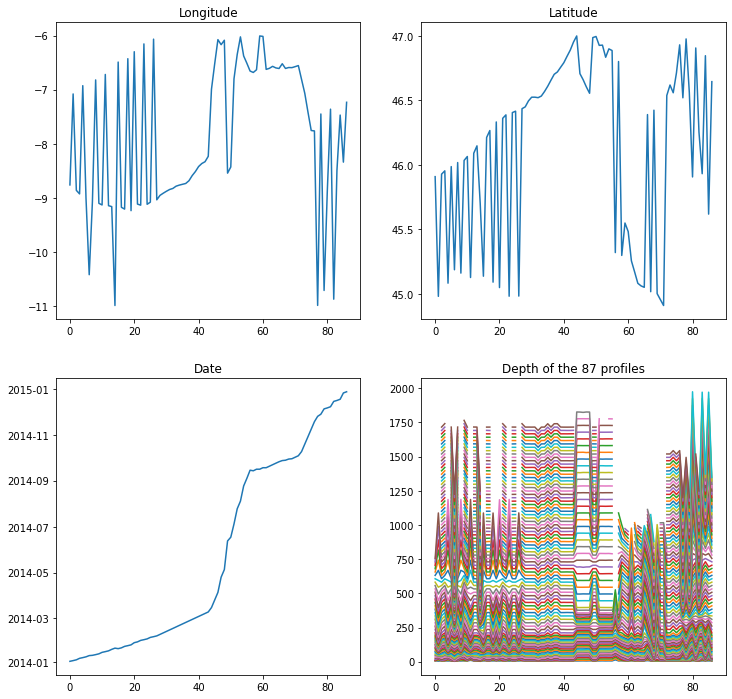

In [4]:
f = plt.figure(figsize=(12, 12))
ax1 = f.add_subplot(221)
ax2 = f.add_subplot(222)
ax3 = f.add_subplot(223)
ax4 = f.add_subplot(224)

ax1.plot(file['LONGITUDE'])
ax1.set_title('Longitude')
ax2.plot(file['LATITUDE'])
ax2.set_title('Latitude')
ax3.plot( file['JULD'])
ax3.set_title('Date')
ax4.plot(file['DEPH'][:,0:86])
ax4.set_title('Depth of the 87 profiles')

Now let's locate the profiles

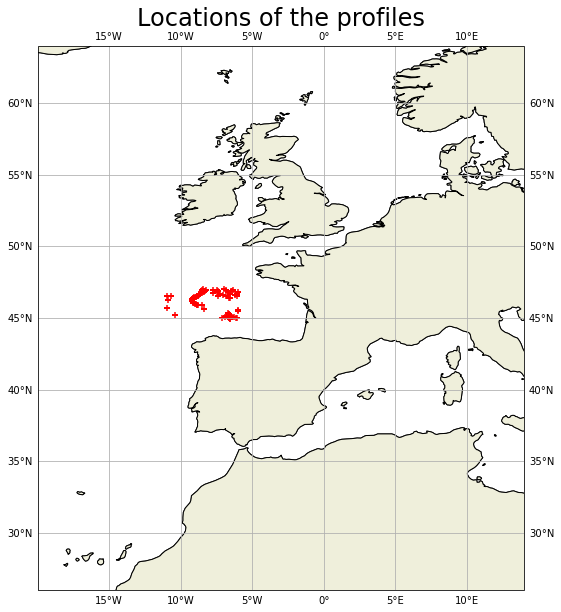

In [7]:
# define the caracteristics of the plot
data_crs = ccrs.PlateCarree()
projection=ccrs.PlateCarree(central_longitude=0)
plt.figure(figsize=(10, 10))
ax = plt.axes(projection=projection)

ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')
ax.set_extent([-20, 14, 26, 64],crs=ccrs.PlateCarree())
ax.set_title("Locations of the profiles",fontsize=24)

# plot
ax.scatter(file['LONGITUDE'],file['LATITUDE'],c='r',marker='+',transform=data_crs)

# save
plt.savefig('VIEW/CLASS4/FIGURES/Part1/location_profiles.png')

<div class="alert alert-block alert-success"

**Question 1 :** From this first basic analysis of the contents of the file, what kind of observations do you think you are looking at?

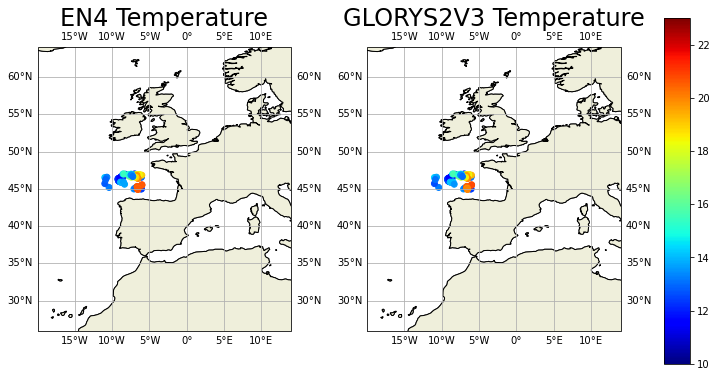

In [9]:
# define the caracteristics of the plots
data_crs = ccrs.PlateCarree()
projection=ccrs.PlateCarree(central_longitude=0)
f = plt.figure(figsize=(12, 12))
ax1 = f.add_subplot(121,projection=ccrs.PlateCarree())
ax2 = f.add_subplot(122,projection=ccrs.PlateCarree())

for ax in [ax1,ax2]:
    ax.coastlines()
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')
    ax.set_extent([-20, 14, 26, 64],crs=ccrs.PlateCarree())

# plot    
im = ax1.scatter(file['LONGITUDE'],file['LATITUDE'],c=file['TENS'][:,0],cmap='jet',vmin=10,vmax=23,marker='o',transform=data_crs)
im = ax2.scatter(file['LONGITUDE'],file['LATITUDE'],c=file['TINTERP'][:,0],cmap='jet',vmin=10,vmax=23,marker='o',transform=data_crs)

# legend
ax1.set_title("EN4 Temperature",fontsize=24)
ax2.set_title("GLORYS2V3 Temperature",fontsize=24)
f.subplots_adjust(right=0.8,wspace=0.3)
cbar_ax = f.add_axes([0.85, 0.3, 0.03, 0.4])
f.colorbar(im, cax=cbar_ax)

# save
plt.savefig('VIEW/CLASS4/FIGURES/Part1/EN4_GLORYS2v3_temperature.png')

Now look at the difference between the two fields and at the value of depth at each point

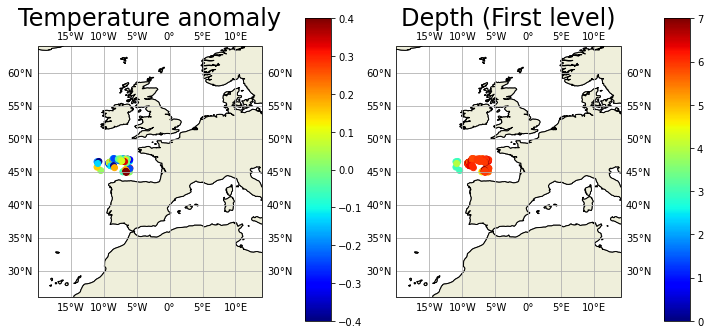

In [10]:
# define the caracteristics of the plots
data_crs = ccrs.PlateCarree()
projection=ccrs.PlateCarree(central_longitude=0)
f = plt.figure(figsize=(12, 12))
ax1 = f.add_subplot(121,projection=ccrs.PlateCarree())
ax2 = f.add_subplot(122,projection=ccrs.PlateCarree())

for ax in [ax1,ax2]:
    ax.coastlines()
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')
    ax.set_extent([-20, 14, 26, 64],crs=ccrs.PlateCarree())

# plot    
im1 = ax1.scatter(file['LONGITUDE'],file['LATITUDE'],c=file['TENS'][:,0]-file['TINTERP'][:,0],cmap='jet',vmin=-0.4,vmax=0.4,marker='o',transform=data_crs)
im2 = ax2.scatter(file['LONGITUDE'],file['LATITUDE'],c=file['DEPH'][:,0],cmap='jet',vmin=0,vmax=7,marker='o',transform=data_crs)


# legend
ax1.set_title("Temperature anomaly",fontsize=24)
ax2.set_title("Depth (First level)",fontsize=24)

f.subplots_adjust(right=0.8,wspace=0.6)
cbar_ax = f.add_axes([0.85,  0.33, 0.03, 0.35])
f.colorbar(im2, cax=cbar_ax)
cbar_ax = f.add_axes([0.435,  0.33, 0.03, 0.35])
plt.colorbar(im1, cax=cbar_ax)

# save
plt.savefig('VIEW/CLASS4/FIGURES/Part1/Tanom_depth.png')

Now, using these simple tools, try to draw only the XBT values near 3000 m....

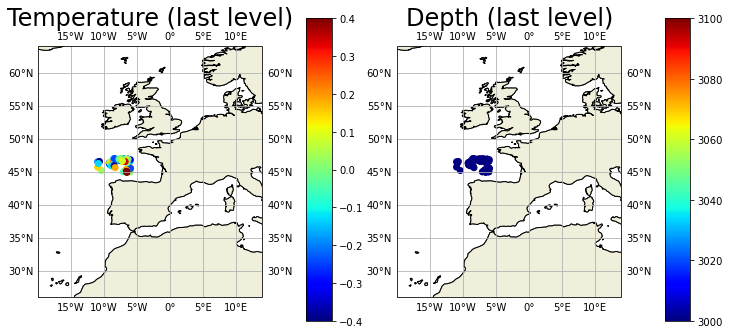

In [11]:
# define the caracteristics of the plots
data_crs = ccrs.PlateCarree()
projection=ccrs.PlateCarree(central_longitude=0)
f = plt.figure(figsize=(12, 12))
ax1 = f.add_subplot(121,projection=ccrs.PlateCarree())
ax2 = f.add_subplot(122,projection=ccrs.PlateCarree())

for ax in [ax1,ax2]:
    ax.coastlines()
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')
    ax.set_extent([-20, 14, 26, 64],crs=ccrs.PlateCarree())

# plot
im1 = ax1.scatter(file['LONGITUDE'],file['LATITUDE'],c=file['TENS'][:,0]-file['TINTERP'][:,0],cmap='jet',vmin=-0.4,vmax=0.4,marker='o',transform=data_crs)    
im2 = ax2.scatter(file['LONGITUDE'],file['LATITUDE'],c=file['DEPH'][:,0],cmap='jet',vmin=3000,vmax=3100,marker='o',transform=data_crs)

# legend
ax1.set_title("Temperature (last level)",fontsize=24)
ax2.set_title("Depth (last level)",fontsize=24)

cbar_ax = f.add_axes([0.435, 0.33, 0.03, 0.35])
plt.colorbar(im1, cax=cbar_ax)
f.subplots_adjust(right=0.8,wspace=0.6)
cbar_ax = f.add_axes([0.85, 0.33, 0.03, 0.35])
f.colorbar(im2, cax=cbar_ax)

ax1.set_title("Temperature (last level)",fontsize=24)
# save
plt.savefig('VIEW/CLASS4/FIGURES/Part1/T_depth_last.png')

We now want to estimate the average quality of the IBIRYS and GLORYS systems with those departures from observations, so we'll draw statistics into layers for each system, subregion and season.

In [12]:
# loop on each region and each season
#for region in ['BISCAY','NORTHA', 'NORTHS','IRSEA']:
for region in ['BISCAY']:
    for saison in ['000', '001', '002', '003','004']:
        
        # load the files of the 2 models
        path_file_1 = 'VIEW/CLASS4/DATA/Part1/subsampling_GLORYS2V3_2014_'+saison+'_'+region+'.nc'
        file_1 = xr.open_dataset(path_file_1)
        
        path_file_2 = 'VIEW/CLASS4/DATA/Part1/subsampling_IBIRYSV1R1_2014_'+saison+'_'+region+'.nc'
        file_2 = xr.open_dataset(path_file_2)
        
        
        
        #### regrid so that all instruments have the same depth range
        
        grid=[]
        
        for i in range(0,200,2):
            grid.append(i)  
        
        idx_d_1 = []
        idx_d_2 = []
        
        Tobs1 =np.zeros([len(grid),len(file_1['LONGITUDE'])])
        Tobs2=np.zeros([len(grid),len(file_1['LONGITUDE'])])
        Tmod1=np.zeros([len(grid),len(file_1['LONGITUDE'])])
        Tmod2=np.zeros([len(grid),len(file_1['LONGITUDE'])])
        
        Sobs1 =np.zeros([len(grid),len(file_1['LONGITUDE'])])
        Sobs2=np.zeros([len(grid),len(file_1['LONGITUDE'])])
        Smod1=np.zeros([len(grid),len(file_1['LONGITUDE'])])
        Smod2=np.zeros([len(grid),len(file_1['LONGITUDE'])])
        

        
        # loop on each profiler
        for k in range(len(file_1['LONGITUDE'])-1):
            ### loop on each depth
            for d in range(len(grid)) : 
                idx_d_1 = np.nanargmin(np.abs(file_1['DEPH'][k,:] - grid[d]))
                idx_d_2 = np.nanargmin(np.abs(file_2['DEPH'][k,:] - grid[d]))
                
                Tobs1[d,k]=file_1['TENS'][k,idx_d_1]
                Tobs2[d,k]=file_2['TENS'][k,idx_d_2]
                
                Sobs1[d,k]=file_1['SENS'][k,idx_d_1]
                Sobs2[d,k]=file_2['SENS'][k,idx_d_2]        
                
                Tmod1[d,k]=file_1['TINTERP'][k,idx_d_1]
                Tmod2[d,k]=file_2['TINTERP'][k,idx_d_2]
                
                Smod1[d,k]=file_1['SINTERP'][k,idx_d_1]
                Smod2[d,k]=file_2['SINTERP'][k,idx_d_2]   
                
        
        #### calculate the mean for each depth and the difference mean_obs-mean_mod
        Tobsmean1 = np.zeros([len(grid),1])
        Tobsmean2 = np.zeros([len(grid),1])
        Tmodmean1 = np.zeros([len(grid),1])
        Tmodmean2 = np.zeros([len(grid),1])
        Sobsmean1 = np.zeros([len(grid),1])
        Sobsmean2 = np.zeros([len(grid),1])
        Smodmean1 = np.zeros([len(grid),1])
        Smodmean2 = np.zeros([len(grid),1])
        
        Tdiff1 = np.zeros([len(grid),1])
        Tdiff2 = np.zeros([len(grid),1])
        Sdiff1 = np.zeros([len(grid),1])
        Sdiff2 = np.zeros([len(grid),1])
        
        for i in range(len(grid)):
            Tobsmean1[i] = np.nanmean(Tobs1[i])
            Tobsmean2[i] = np.nanmean(Tobs2[i])
            Sobsmean1[i] = np.nanmean(Sobs1[i])
            Sobsmean2[i] = np.nanmean(Sobs2[i])
            Tmodmean1[i] = np.nanmean(Tmod1[i])
            Tmodmean2[i] = np.nanmean(Tmod2[i])
            Smodmean1[i] = np.nanmean(Smod1[i])
            Smodmean2[i] = np.nanmean(Smod2[i])
        
            Tdiff1[i] = Tmodmean1[i] - Tobsmean1[i]  
            Tdiff2[i] = Tmodmean2[i] - Tobsmean2[i] 
            Sdiff1[i] = Smodmean1[i] - Sobsmean1[i]  
            Sdiff2[i] = Smodmean2[i] - Sobsmean2[i]
        
        # calculate RMS for each depth
        Trms1 = np.zeros([len(grid),1])
        Trms2 = np.zeros([len(grid),1])
        Srms1 = np.zeros([len(grid),1])
        Srms2 = np.zeros([len(grid),1])
        
        for d in range(len(grid)):
            RMS_T1 = 0
            RMS_T2 = 0
            RMS_S1 = 0
            RMS_S2 = 0
            for k in range(len(file_1['LONGITUDE'])):
                RMS_T1 = RMS_T1 + (Tobs1[d,k]-Tmod1[d,k])**2
                RMS_T2 = RMS_T2 + (Tobs2[d,k]-Tmod2[d,k])**2
                RMS_S1 = RMS_S1 + (Sobs1[d,k]-Smod1[d,k])**2
                RMS_S2 = RMS_S2 + (Sobs2[d,k]-Smod2[d,k])**2
            
            Trms1[d] = RMS_T1**0.5 / len(file_1['LONGITUDE'])
            Trms2[d] = RMS_T2**0.5 / len(file_2['LONGITUDE'])
            Srms1[d] = RMS_S1**0.5 / len(file_1['LONGITUDE'])
            Srms2[d] = RMS_S2**0.5 / len(file_1['LONGITUDE'])
            
        
        # plot figures
        f = plt.figure(figsize=(20, 12))
        ax1 = f.add_subplot(131)
        ax2 = f.add_subplot(132)
        ax3 = f.add_subplot(133,projection=ccrs.PlateCarree())
        ax1.invert_yaxis()
        ax2.invert_yaxis()
        ax1.xaxis.tick_top()
        ax2.xaxis.tick_top()
                
        ax1.plot(Tdiff1*0,grid,'--',color='tab:gray') # RMS0
        p1, = ax1.plot(Tdiff1,grid,color='tab:blue',label='BIAIS') #RMS1
        ax1.plot(Tdiff2,grid,color='tab:orange') #RMS1
        p2, = ax1.plot(Trms1,grid,'--',color='tab:blue',label='RMS')
        ax1.plot(Trms2,grid,'--',color='tab:orange')
        
        ax1.legend(handles = [p1,p2],fontsize=25,loc='lower right')
        
        p1, = ax2.plot(Tmodmean1,grid,color='tab:blue',label='GLORYS2V3')
        p2, = ax2.plot(Tmodmean2,grid,color='tab:orange',label='IBIRYSV1R1')
        p3, = ax2.plot(Tobsmean2,grid,color='tab:olive',label='OBS')
        
        ax2.legend(handles = [p1,p2,p3],fontsize=25,loc='lower right')
        f.suptitle(region+' Temperature Biais & RMS -  Mean profiles',fontsize=24,y=0.95)
        
        ax3.coastlines()
        ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        ax3.add_feature(cfeature.LAND, zorder=1, edgecolor='k')    
        ax3.set_extent([-20, 14, 26, 64], ccrs.PlateCarree())
        ax3.scatter(file_1['LONGITUDE'],file_1['LATITUDE'],marker='o',color='tab:red')
        ax3.set_title('Location of the profiles',fontsize=24)
        
        
        plt.savefig('VIEW/CLASS4/FIGURES/Part1/mean_profiles/'+region+'_'+saison+'_temperature.png')
        plt.close()
        
        f = plt.figure(figsize=(20, 12))
        ax1 = f.add_subplot(131)
        ax2 = f.add_subplot(132)
        ax3 = f.add_subplot(133,projection=ccrs.PlateCarree())
        ax1.invert_yaxis()
        ax2.invert_yaxis()
        ax1.xaxis.tick_top()
        ax2.xaxis.tick_top()
        
        ax1.plot(Sdiff1*0,grid,'--',color='tab:gray') # RMS0
        p1, = ax1.plot(Sdiff1,grid,color='tab:blue',label='BIAIS') #RMS1
        ax1.plot(Sdiff2,grid,color='tab:orange') #RMS1
        p2, = ax1.plot(Srms1,grid,'--',color='tab:blue',label='RMS')
        ax1.plot(Srms2,grid,'--',color='tab:orange')
        
        ax1.legend(handles = [p1,p2],fontsize=25,loc='lower right')
        
        p1, = ax2.plot(Smodmean1,grid,color='tab:blue',label='GLORYS2V3')
        p2, = ax2.plot(Smodmean2,grid,color='tab:orange',label='IBIRYSV1R1')
        p3, = ax2.plot(Sobsmean2,grid,color='tab:olive',label='OBS')
        
        ax2.legend(handles = [p1,p2,p3],fontsize=25,loc='lower right')
        f.suptitle(region+' Salinity Biais & RMS - Mean profiles',fontsize=24,y=0.95)
        
        ax3.coastlines()
        ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        ax3.add_feature(cfeature.LAND, zorder=1, edgecolor='k')    
        ax3.set_extent([-20, 14, 26, 64], ccrs.PlateCarree())
        ax3.scatter(file_1['LONGITUDE'],file_1['LATITUDE'],marker='o',color='tab:red')
        ax3.set_title('Location of the profiles',fontsize=24)
        
        plt.savefig('VIEW/CLASS4/FIGURES/Part1/mean_profiles/'+region+'_'+saison+'_salinity.png')
        plt.close()
        #the figures do not appear here (too many) but are saved in VIEW/CLASS4/FIGURES/Part1/mean_profiles/
    


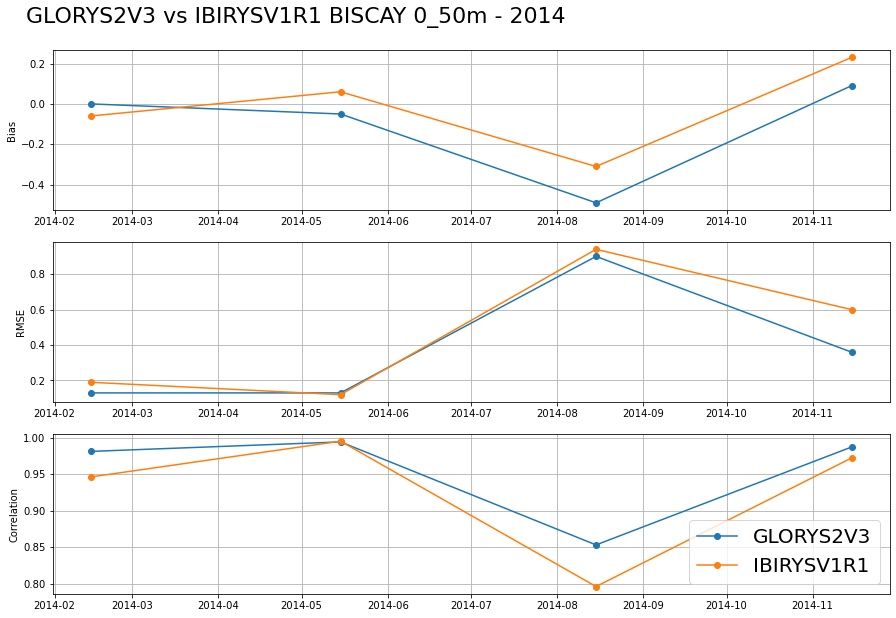

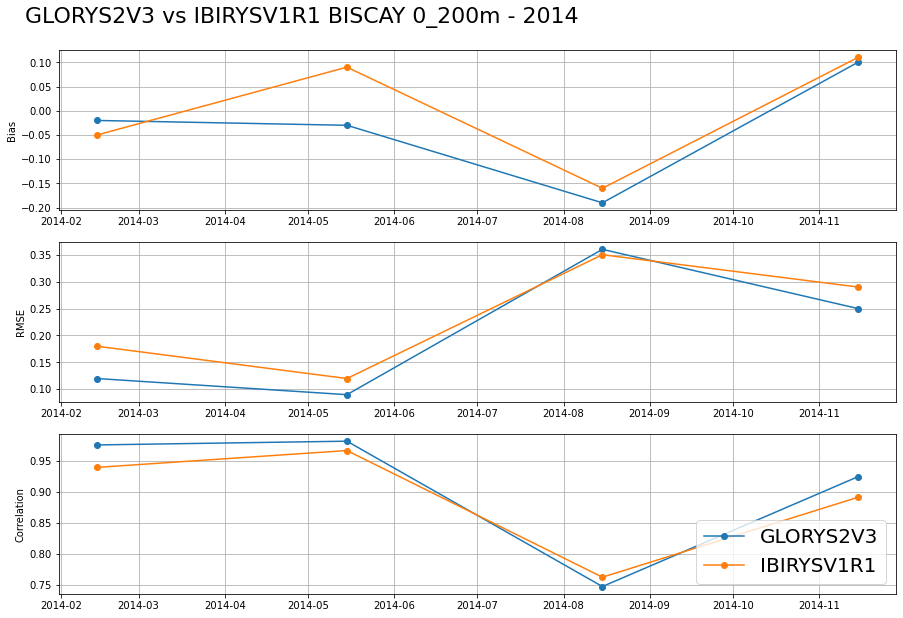

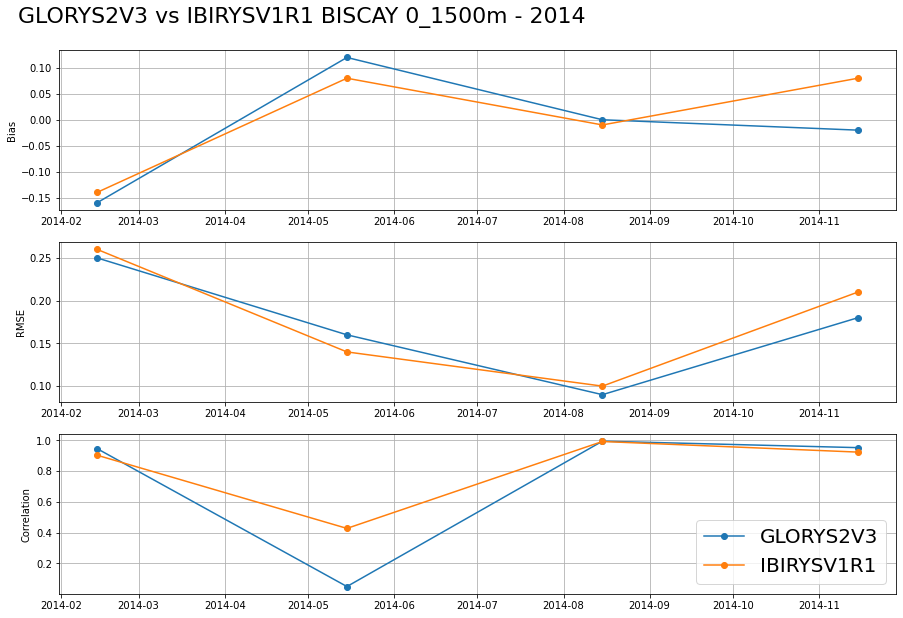

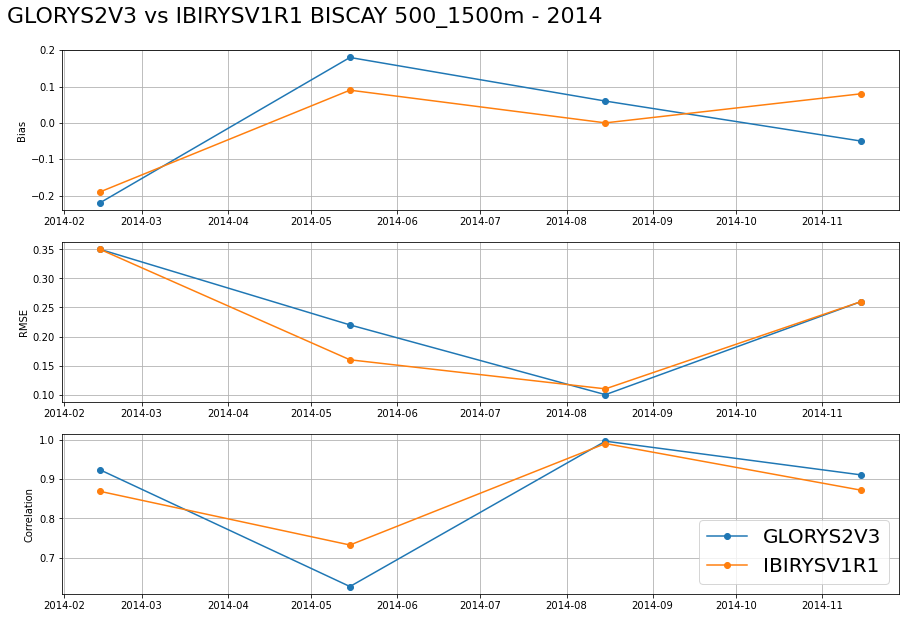

In [15]:
# define the reference timestep
origine = np.datetime64('1950-01-01')

# plot Bias, RMS and Correlation for each region and depth range
for region in ['BISCAY']:#, 'IRSEA', 'NORTH', 'NORTHA', 'NORTHS']:
    for zrange in ['0_50', '0_200', '0_1500', '500_1500']:
        path_file_dat1 ='VIEW/CLASS4/DATA/DAT/stats_GLORYS2V3_2014_'+region+'_'+zrange+'.dat'
        path_file_dat2 ='VIEW/CLASS4/DATA/DAT/stats_IBIRYSV1R1_2014_'+region+'_'+zrange+'.dat'
        datfile1 = open(path_file_dat1, 'r')
        datfile2 = open(path_file_dat2, 'r')
        lines1 = datfile1.readlines()
        lines2 = datfile2.readlines()
        for i in range(4):
            lines1[i] = lines1[i].split()
            lines1[i][6]=lines1[i][6].rstrip('\n')
            lines2[i] = lines2[i].split()
            lines2[i][6]=lines2[i][6].rstrip('\n')
        juld1 = []
        t_mean_bias1 =[]
        t_rmse1 = []
        t_correl1 = []
        s_mean_bias1 = []
        s_rmse1 = []
        s_correl1 = []
        juld2 = []
        t_mean_bias2 =[]
        t_rmse2 = []
        t_correl2 = []
        s_mean_bias2 = []
        s_rmse2 = []
        s_correl2 = []        
        
        for i in range(4):
            juld1.append(origine+int(lines1[i][0]))
            t_mean_bias1.append(float(lines1[i][1]))
            t_rmse1.append(float(lines1[i][2]))
            t_correl1.append(float(lines1[i][3]))
            s_mean_bias1.append(float(lines1[i][4]))
            s_rmse1.append(float(lines1[i][5]))
            s_correl1.append(float(lines1[i][6]))
            
            juld2.append(origine+int(lines2[i][0]))
            t_mean_bias2.append(float(lines2[i][1]))
            t_rmse2.append(float(lines2[i][2]))
            t_correl2.append(float(lines2[i][3]))
            s_mean_bias2.append(float(lines2[i][4]))
            s_rmse2.append(float(lines2[i][5]))
            s_correl2.append(float(lines2[i][6]))
            
        f = plt.figure(figsize=(15, 10))
        ax1 = f.add_subplot(311)
        ax2 = f.add_subplot(312)
        ax3 = f.add_subplot(313)
        
        for ax in [ax1,ax2,ax3]:
            ax.grid()
        
        ax1.plot(juld1,t_mean_bias1,'o-',color='tab:blue')
        ax1.plot(juld2,t_mean_bias2,'o-',color='tab:orange')
        ax1.set_ylabel('Bias')
        
        ax2.plot(juld1,t_rmse1,'o-',color='tab:blue')
        ax2.plot(juld2,t_rmse2,'o-',color='tab:orange')
        ax2.set_ylabel('RMSE')

        p1, = ax3.plot(juld1,t_correl1,'o-',color='tab:blue',label='GLORYS2V3')
        p2, = ax3.plot(juld2,t_correl2,'o-',color='tab:orange',label='IBIRYSV1R1')
        ax3.set_ylabel('Correlation')      
        
        ax.legend(handles = [p1,p2],fontsize=20,loc='lower right')
        
        plt.suptitle('GLORYS2V3 vs IBIRYSV1R1 '+region+' '+zrange+'m - 2014',fontsize=22,y=0.94,x=0.35)
        
        plt.savefig('VIEW/CLASS4/FIGURES/Part1/quarterly_stats/quarterly_stats_2014_'+region+'_'+zrange+'.png')
        

________________________
# Part 2 : Hydrological section

Pathway of the ASPEX3 compaign (Images SISMER/IFREMER). The G section is in red : 

<img src=VIEW/CLASS4/IMAGES/ASPEX3_Compaingn.gif alt="Drawing" width="450" >
                        
This  exercise consists in comparing the vertical sections of temperature and salinity measured during a oceanographic campaign. Here we use the data of the Aspex campaign (MARIE Louis (2010) ASPEX3 cruise, RV Thalassa, http://dx.doi.org/10.17600/10040070): data consist in vertical sections of temperature and salinity across the shelf of the Bay of Biscay (the section is along shore).

Example comparaison : **GLORYS2V3** and **IBIRYSV1R1** vs **ASPEX** Cruise (Temperature and Salinity section)

In [16]:
rad_letter = 'G'
rad_date = '20100906'

path_file = 'VIEW/CLASS4/DATA/Part2/Section_'+rad_letter+'_'+rad_date+'.nc'
file = xr.open_dataset(path_file)

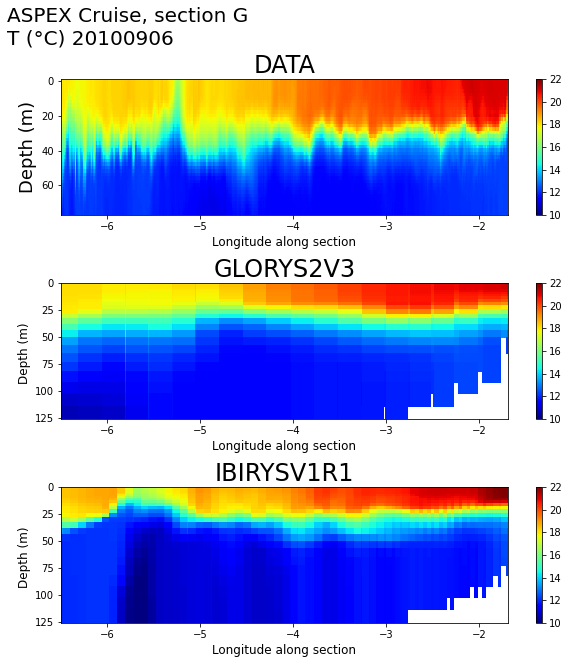

In [18]:
path_file1 = 'VIEW/CLASS4/DATA/Part2/GLORYS2V3_1dAV_20100906_20100907_gridT_R20100908.nc'
path_file2 = 'VIEW/CLASS4/DATA/Part2/IBIRYSV1R1_1dAV_20100906_20100907_gridT_R20100910.nc'
file1 = xr.open_dataset(path_file1)
file2 = xr.open_dataset(path_file2)

T_data1 = np.zeros((75,515))
T_data2 = np.zeros((75,515))
for i in range(515):
    idx_lon1 = np.nanargmin(np.abs(file1['nav_lon'][0,:].data-file['longitude'].data[i]))
    idx_lat1 = np.nanargmin(np.abs(file1['nav_lat'][:,0].data-file['latitude'].data[i]))
    
    idx_lon2 = np.nanargmin(np.abs(file2['nav_lon'][0,:].data-file['longitude'].data[i]))
    idx_lat2 = np.nanargmin(np.abs(file2['nav_lat'][:,0].data-file['latitude'].data[i]))
    
    T_data1[:,i] = file1['votemper'].data[0,:,idx_lat1,idx_lon1]
    T_data2[:,i] = file2['votemper'].data[0,:,idx_lat2,idx_lon2]

    
# define the caracteristics of the plot
f = plt.figure(figsize=(10,10))
ax1 = f.add_subplot(311)
ax2 = f.add_subplot(312)
ax3 = f.add_subplot(313)
f.suptitle('ASPEX Cruise, section G \nT (°C) 20100906',fontsize=20,ha='left',x =0.05)

# first plot 
ax1.set_title("DATA",fontsize=24)
ax1.set_ylabel("Depth (m)",fontsize=18)
ax1.set_xlabel("Longitude along section",fontsize=12)
ax1.invert_yaxis()
im1 = ax1.pcolor(file['longitude'][:],file['depth'][0:39],file['temperature'][0:39,:], vmin = 10, vmax = 22,cmap='jet',shading='nearest')

f.colorbar(im1,ax=ax1)

# second plot
ax2.set_title("GLORYS2V3",fontsize=24)
ax2.set_ylabel("Depth (m) ",fontsize=12)
ax2.set_xlabel("Longitude along section",fontsize=12)
ax2.invert_yaxis()
im2 = ax2.pcolor(file['longitude'][:],file1['deptht'][0:26],T_data1[0:26,:],vmin = 10, vmax = 22,cmap='jet',shading='nearest')
f.colorbar(im2,ax=ax2)


# third plot
ax3.set_title("IBIRYSV1R1",fontsize=24)
ax3.set_ylabel("Depth (m) ",fontsize=12)
ax3.set_xlabel("Longitude along section",fontsize=12)
ax3.invert_yaxis()
im3 = ax3.pcolor(file['longitude'][:],file1['deptht'][0:26],T_data2[0:26,:],vmin = 10, vmax = 22,cmap='jet',shading='nearest')
f.colorbar(im3,ax=ax3)

f.subplots_adjust( hspace= 0.5,wspace=0.3)

# save
plt.savefig('VIEW/CLASS4/FIGURES/Part2/ASPEX_vs_IBIRYSV1R1_vs_GLORYS2V3_temp.png')

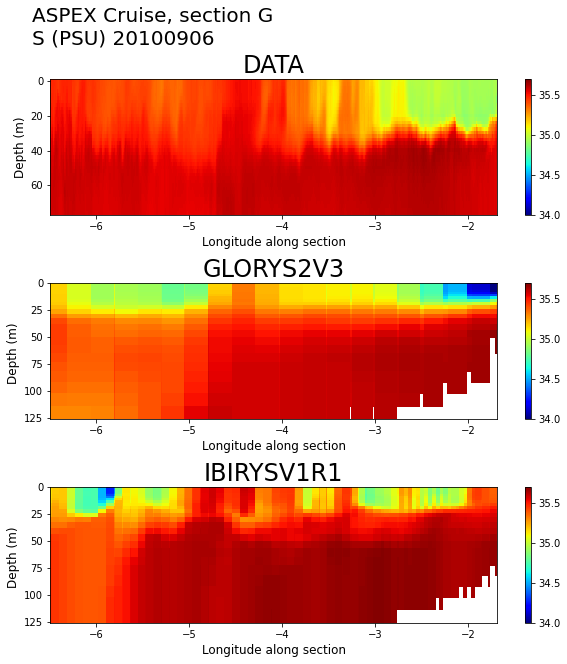

In [19]:
path_file1 = 'VIEW/CLASS4/DATA/Part2/IBIRYSV1R1_1dAV_20100906_20100907_gridS_R20100910.nc'
file1 = xr.open_dataset(path_file1)
path_file2 = 'VIEW/CLASS4/DATA/Part2/GLORYS2V3_1dAV_20100906_20100907_gridS_R20100908.nc'
file2 = xr.open_dataset(path_file2)

S_data1 = np.zeros((75,515))
S_data2 = np.zeros((75,515))

for i in range(515):
    idx_lon1 = np.nanargmin(np.abs(file1['nav_lon'][0,:].data-file['longitude'].data[i]))
    idx_lat1 = np.nanargmin(np.abs(file1['nav_lat'][:,0].data-file['latitude'].data[i]))

    idx_lon2 = np.nanargmin(np.abs(file2['nav_lon'][0,:].data-file['longitude'].data[i]))
    idx_lat2 = np.nanargmin(np.abs(file2['nav_lat'][:,0].data-file['latitude'].data[i]))
    
    S_data1[:,i] = file1['vosaline'].data[0,:,idx_lat1,idx_lon1]
    S_data2[:,i] = file2['vosaline'].data[0,:,idx_lat2,idx_lon2]

# define the caracteristics of the plot
f = plt.figure(figsize=(10,10))
ax1 = f.add_subplot(311)
ax2 = f.add_subplot(312)
ax3 = f.add_subplot(313)

f.suptitle('ASPEX Cruise, section G \nS (PSU) 20100906',fontsize=20,ha='left',x =0.1)

# first plot 
ax1.set_title("DATA",fontsize=24)
ax1.set_ylabel("Depth (m)",fontsize=12)
ax1.set_xlabel("Longitude along section",fontsize=12)
ax1.invert_yaxis()
im1 = ax1.pcolor(file['longitude'][:],file['depth'][0:39],file['salinity'][0:39,:], vmin = 34, vmax = 35.7,cmap='jet',shading='nearest')

f.colorbar(im1,ax=ax1)

# second plot
ax2.set_title("GLORYS2V3",fontsize=24)
ax2.set_ylabel("Depth (m) ",fontsize=12)
ax2.set_xlabel("Longitude along section",fontsize=12)
ax2.invert_yaxis()
im2 = ax2.pcolor(file['longitude'][:],file2['deptht'][0:26],S_data2[0:26,:], vmin = 34, vmax = 35.7,cmap='jet',shading='nearest')
f.colorbar(im2,ax=ax2)

# third plot
ax3.set_title("IBIRYSV1R1",fontsize=24)
ax3.set_ylabel("Depth (m) ",fontsize=12)
ax3.set_xlabel("Longitude along section",fontsize=12)
ax3.invert_yaxis()
im3 = ax3.pcolor(file['longitude'][:],file2['deptht'][0:26],S_data1[0:26,:], vmin = 34, vmax = 35.7,cmap='jet',shading='nearest')
f.colorbar(im3,ax=ax3)

f.subplots_adjust( hspace= 0.5,wspace=0.5)

# save
plt.savefig('VIEW/CLASS4/FIGURES/Part2/ASPEX_vs_GLORYS2V3_vs_IBIRYSV1R1_sal.png')

What we see is that the regional model reproduces better the stratification than the global one. There is in particular a special event in the stratification well reproduced by the regional model but not by the global one. But results in salinity are not satisfying for both models.

________________
# Part 3 : Biscay Poleward coastal jet

Specific processus occuring in the Bay of Biscay.
Location of the ADCP. The triggering mechanism is due to downwelling situation alog the Spanish coast induced by westerlies winds.

<img src=CLASS4/IMAGES/Fig_Part3.png alt="Drawing" width="250" >

Plot time series of the models meridional current and temperature at the observations position.

<img src=CLASS4/IMAGES/Fig_Part3_2.png alt="Drawing" width="550" >
Acoustic Doppler Current Profiler (ADCP ) 2008 data: along-shore velocity, from <font color='green '>Batifoulier 2012.</font>

<img src=CLASS4/IMAGES/Fig_Part3_3.png alt="Drawing" width="650" >
Acoustic Doppler Current Profiler (ADCP ) 2008 data: along-shore temperature (54 m depth) and sea surface height (SSH), from <font color='green '>Batifoulier 2012.</font>

In [20]:
# define the paths of the netcdf files to use
path_file1 = 'VIEW/CLASS4/DATA/Part3/mooring_GLORYS2V3_2002_2014_gridS.nc'
path_file2 = 'VIEW/CLASS4/DATA/Part3/mooring_GLORYS2V3_2002_2014_gridT.nc'
path_file3 = 'VIEW/CLASS4/DATA/Part3/mooring_GLORYS2V3_2002_2014_gridU.nc'
path_file4 = 'VIEW/CLASS4/DATA/Part3/mooring_GLORYS2V3_2002_2014_gridV.nc'
path_file5 = 'VIEW/CLASS4/DATA/Part3/mooring_IBIRYSV1R1_2002_2014_gridS.nc'
path_file6 = 'VIEW/CLASS4/DATA/Part3/mooring_IBIRYSV1R1_2002_2014_gridT.nc'
path_file7 = 'VIEW/CLASS4/DATA/Part3/mooring_IBIRYSV1R1_2002_2014_gridU.nc'
path_file8 = 'VIEW/CLASS4/DATA/Part3/mooring_IBIRYSV1R1_2002_2014_gridV.nc'
path_file9 = 'VIEW/CLASS4/DATA/Part3/GLORYS2V3_1dAV_200808_gridT.nc'
path_file10 = 'VIEW/CLASS4/DATA/Part3/IBIRYSV1R1_1dAV_200808_gridT.nc'

# open the netcdf files
file1 = xr.open_dataset(path_file1)
file2 = xr.open_dataset(path_file2)
file3 = xr.open_dataset(path_file3)
file4 = xr.open_dataset(path_file4)
file5 = xr.open_dataset(path_file5)
file6 = xr.open_dataset(path_file6)
file7 = xr.open_dataset(path_file7)
file8 = xr.open_dataset(path_file8)
file9 = xr.open_dataset(path_file9)
file10 = xr.open_dataset(path_file10)

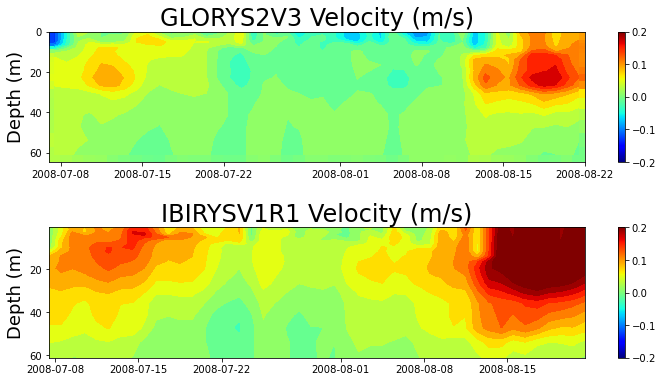

In [22]:
# define the dates to plot
date1 = np.datetime64('2008-07-07')
date2 = np.datetime64('2008-08-22')

# define the plot's caracteristics
f = plt.figure(figsize=(12, 6))
ax1 = f.add_subplot(211)
ax2 = f.add_subplot(212)

# first plot 
ax1.set_title('GLORYS2V3 Velocity (m/s)',fontsize=24)
ax1.set_ylabel("Depth (m)",fontsize=18)
ax1.invert_yaxis()
im0 = ax1.pcolor(file4['time_counter'].sel(time_counter=slice(date1,date2)),file4['deptht'][0:20],np.transpose(file4['vomecrty'][:,0:20,0,0].sel(time_counter=slice(date1,date2)).data),cmap='jet',vmin=-0.2,vmax=0.2,shading='nearest')
im1 = ax1.contourf(file4['time_counter'].sel(time_counter=slice(date1,date2)),file4['deptht'][0:20],np.transpose(file4['vomecrty'][:,0:20,0,0].sel(time_counter=slice(date1,date2)).data),15,cmap='jet',vmin=-0.2,vmax=0.2)

# second plot 
ax2.set_title('IBIRYSV1R1 Velocity (m/s)',fontsize=24)
ax2.set_ylabel("Depth (m)",fontsize=18)
ax2.invert_yaxis()
im2 = ax2.contourf(file8['time_counter'].sel(time_counter=slice(date1,date2)),file8['deptht'][0:20],np.transpose(file8['vomecrty'][:,0:20,0,0].sel(time_counter=slice(date1,date2)).data),15,cmap='jet',vmin=-0.2,vmax=0.2)

f.colorbar(im0,ax=ax1)
f.colorbar(im0,ax=ax2)

f.subplots_adjust( hspace= 0.5,wspace=0.3)

#save
plt.savefig('VIEW/CLASS4/FIGURES/Part3/GLORYS2V3_IBIRYSV1R1_velocity.png')

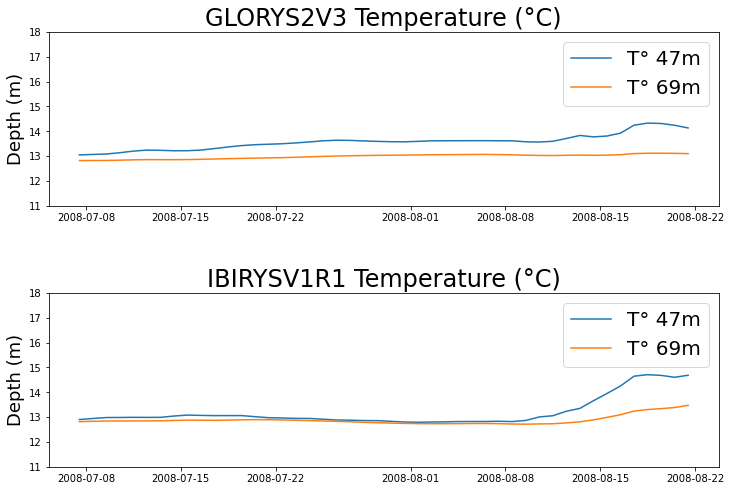

In [23]:
t47 = file2['votemper'][:,0:20,0,0].sel(time_counter=slice(date1,date2)).sel(deptht=47,method='nearest')
t69 = file2['votemper'][:,0:20,0,0].sel(time_counter=slice(date1,date2)).sel(deptht=69,method='nearest')

f = plt.figure(figsize=(12, 8))
ax1 = f.add_subplot(211)
ax2 = f.add_subplot(212)

ax1.set_title("GLORYS2V3 Temperature (°C)",fontsize=24)

# first plot 
ax1.set_ylabel("Depth (m)",fontsize=18)
ax1.set_ylim(11,18)

im1, = ax1.plot(file2['time_counter'].sel(time_counter=slice(date1,date2)), t47, label= 'T° 47m')
im2, = ax1.plot(file2['time_counter'].sel(time_counter=slice(date1,date2)), t69, label= 'T° 69m')
ax1.legend(handles = [im1,im2],fontsize=20)


t47 = file6['votemper'][:,0:20,0,0].sel(time_counter=slice(date1,date2)).sel(deptht=47,method='nearest')
t69 = file6['votemper'][:,0:20,0,0].sel(time_counter=slice(date1,date2)).sel(deptht=69,method='nearest')

# second plot 
ax2.set_title("IBIRYSV1R1 Temperature (°C)",fontsize=24)
ax2.set_ylabel("Depth (m)",fontsize=18)
ax2.set_ylim(11,18)

im1, = ax2.plot(file2['time_counter'].sel(time_counter=slice(date1,date2)), t47, label= 'T° 47m')
im2, = ax2.plot(file2['time_counter'].sel(time_counter=slice(date1,date2)), t69, label= 'T° 69m')
ax2.legend(handles = [im1,im2],fontsize=20)

f.subplots_adjust( hspace= 0.5,wspace=0.3)

#save
plt.savefig('VIEW/CLASS4/FIGURES/Part3/GLORYS2V3_IBIRYSV1R1_temperature_d47_d69.png')

Plot daily figures of wind stress and current and temperature at 21m depth for August 2008

/opt/anaconda3/envs/unesco/lib/python3.7/site-packages/ipykernel/__main__.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


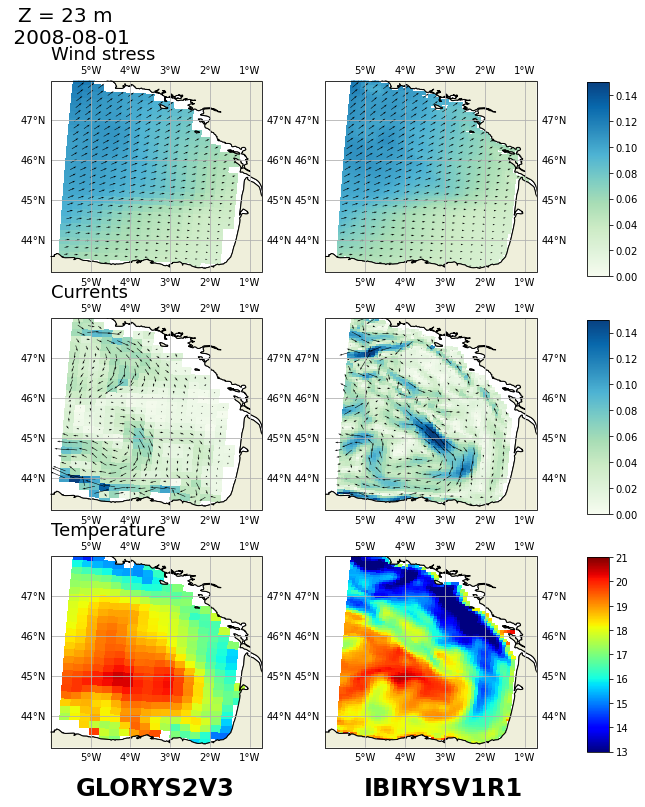

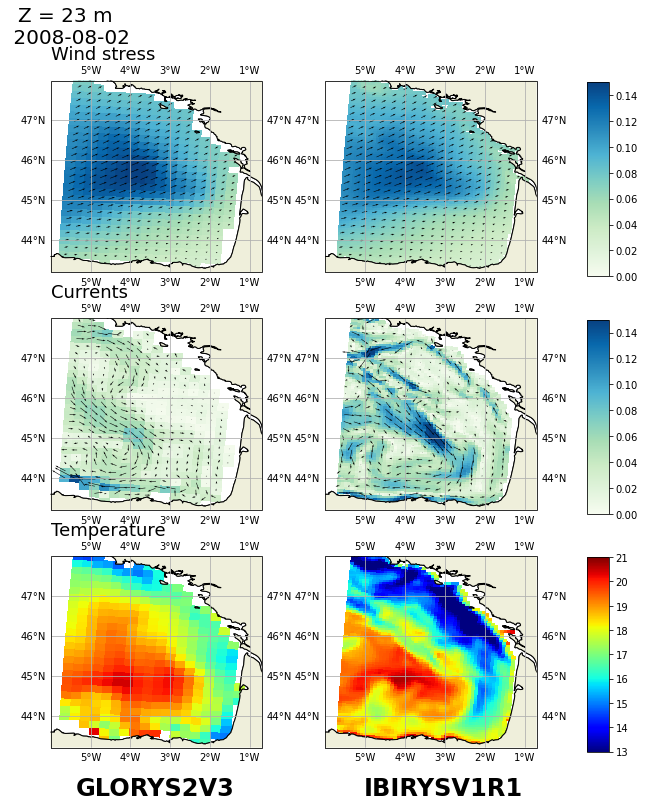

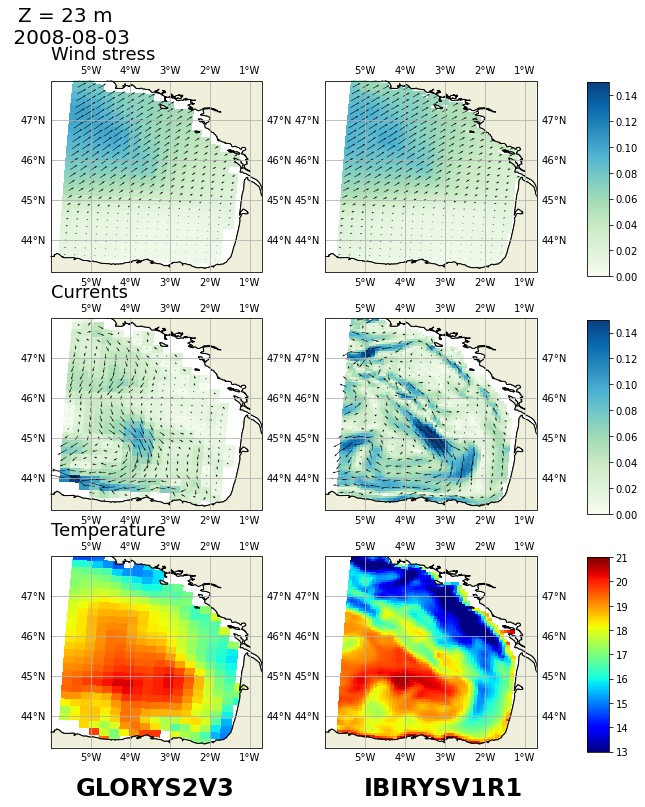

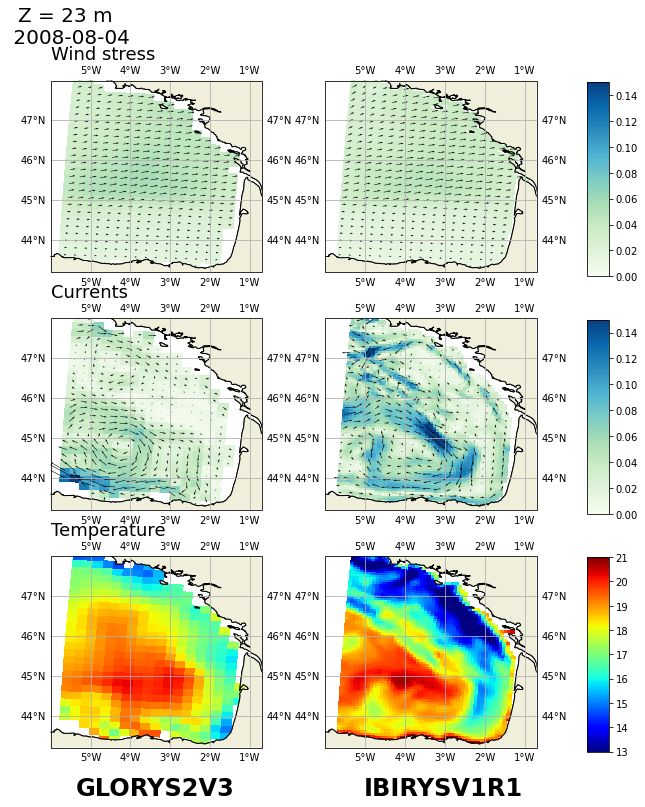

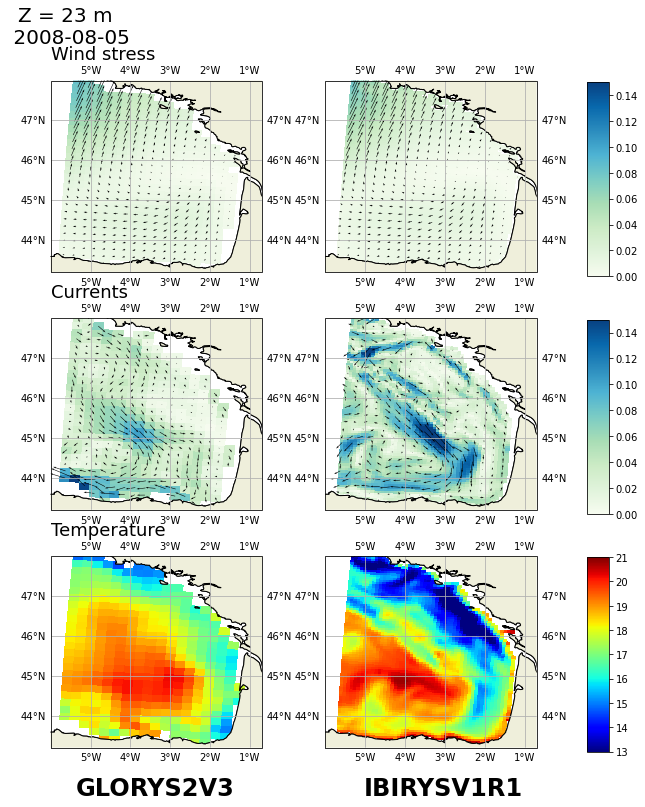

...

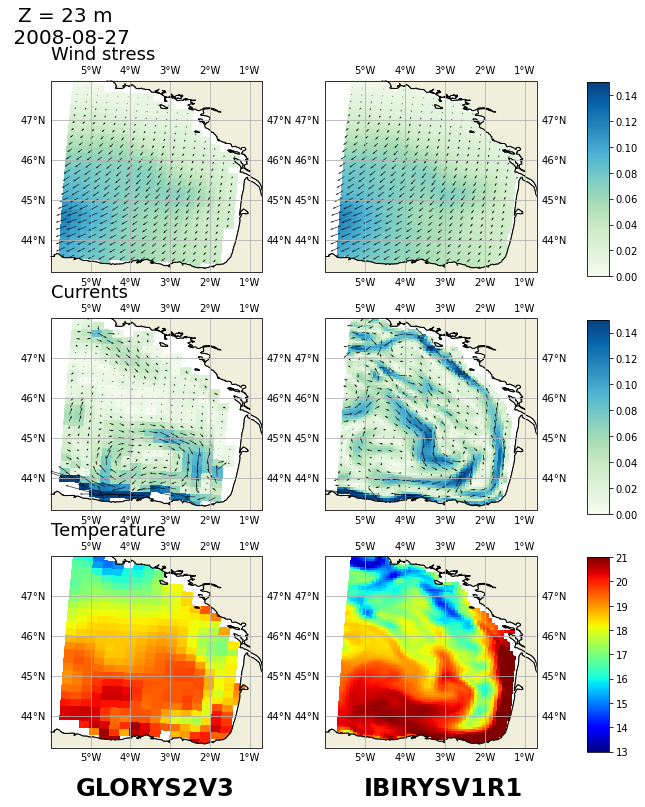

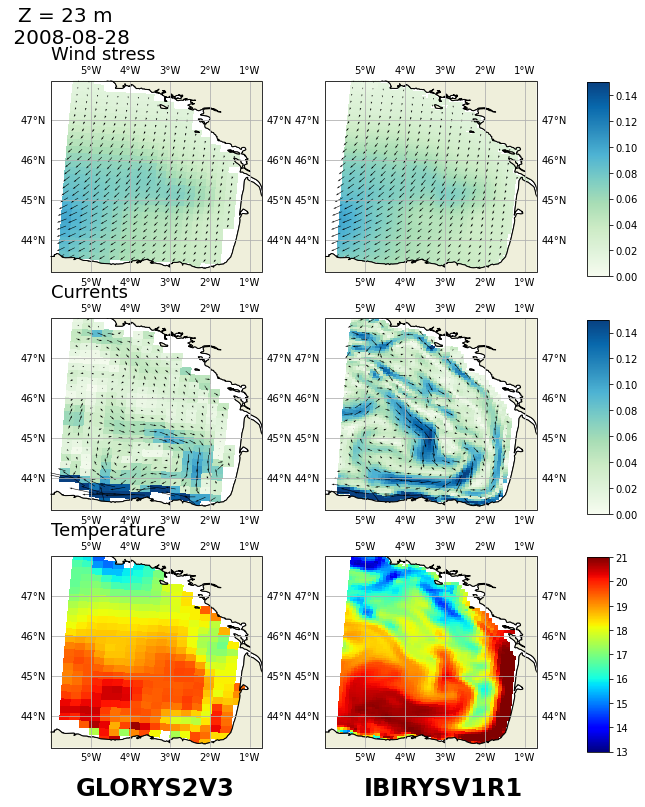

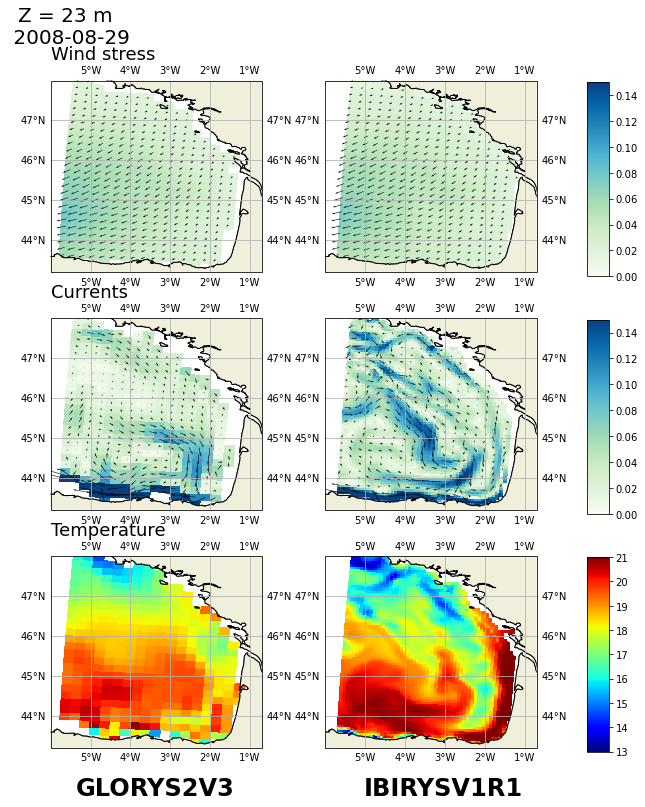

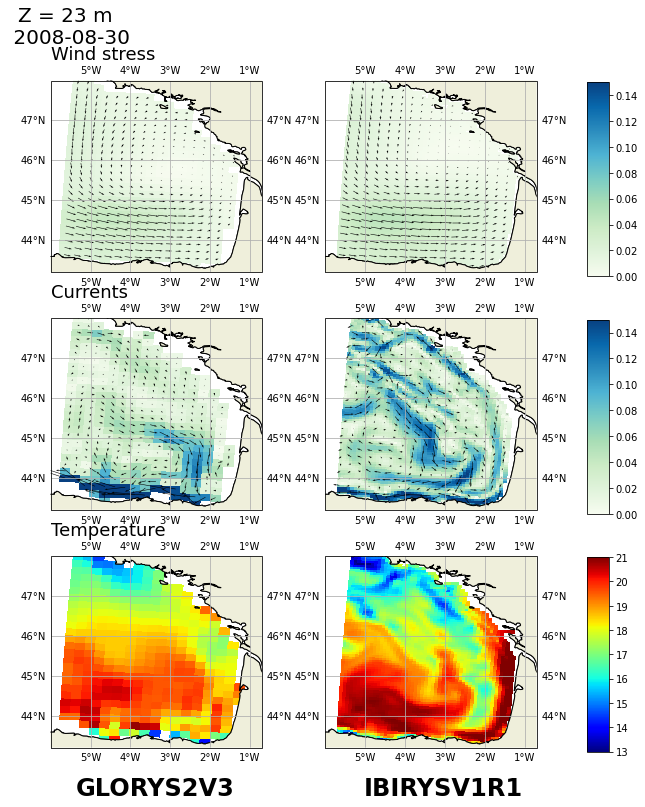

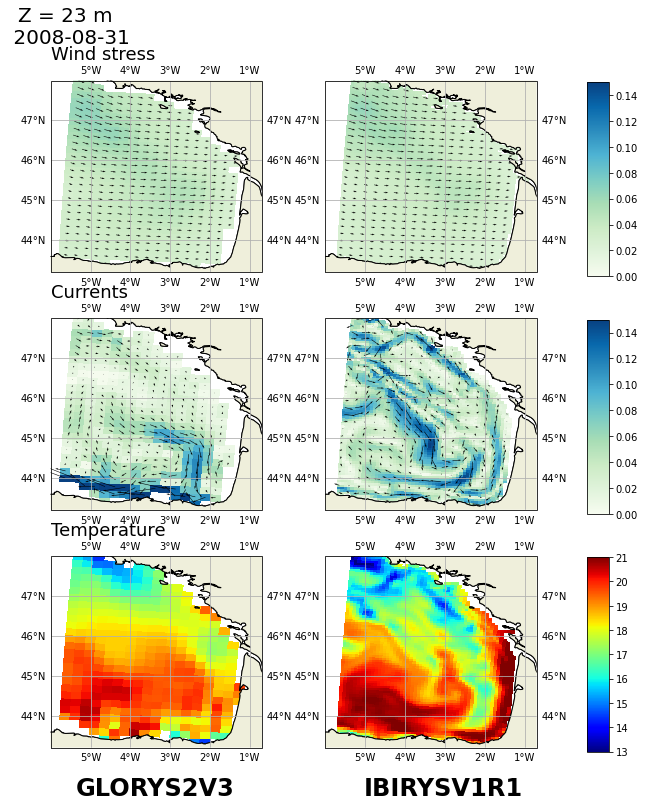

In [26]:
# define the variables to plot
lon_1 =file9['nav_lon']
lat_1 =file9['nav_lat']

lon_2 =file10['nav_lon']
lat_2 =file10['nav_lat']

u_1 = file9['vozocrtx']
v_1 = file9['vomecrty']

u_2 = file10['vozocrtx']
v_2 = file10['vomecrty']

norme_1 = (u_1**2 + v_1**2)**0.5
norme_2 = (u_2**2 + v_2**2)**0.5

taux_1 = file9['sozotaux']
tauy_1 = file9['sometauy']

taux_2 = file10['sozotaux']
tauy_2 = file10['sometauy']

wnorme_1 = (taux_1**2 + tauy_1**2)**.5
wnorme_2 = (taux_2**2 + tauy_2**2)**.5

temp_1 = file9['votemper']
sal_1 = file9['vosaline']

temp_2 = file10['votemper']
sal_2 = file10['vosaline']


depth = 23
# loop on August 2008 days
for i in range(len(file10['time_counter'].data)):
    
    # define plot caracteristics
    f = plt.figure(figsize=(10, 15))
    ax1 = f.add_subplot(321,projection=ccrs.PlateCarree())
    ax2 = f.add_subplot(322,projection=ccrs.PlateCarree())
    ax3 = f.add_subplot(323,projection=ccrs.PlateCarree())
    ax4 = f.add_subplot(324,projection=ccrs.PlateCarree())
    ax5 = f.add_subplot(325,projection=ccrs.PlateCarree())
    ax6 = f.add_subplot(326,projection=ccrs.PlateCarree())
    
    f.suptitle('Z = 23 m \n '+np.datetime_as_string(file10['time_counter'].data[i], unit='D'),fontsize=20,y=0.88,x=0.15)
    f.text(0.16,0.15,'GLORYS2V3',fontsize=24,fontweight='bold')
    f.text(0.56,0.15,'IBIRYSV1R1',fontsize=24,fontweight='bold')
    for ax in [ax1,ax2,ax3,ax4,ax5,ax6]:
        ax.coastlines()
        ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')
        ax.set_extent([-6,-0.7,43.2,48])
    
    ax1.set_title('Wind stress', loc='left',fontsize=18)
    ax3.set_title('Currents', loc='left',fontsize=18)
    ax5.set_title('Temperature', loc='left',fontsize=18)
    
    # plot wind stress
    im1 = ax1.pcolor(lon_1,lat_1,wnorme_1[i,:,:],cmap='GnBu',vmin=0,vmax=0.15,shading='nearest')
    ax1.quiver(lon_1,lat_1,taux_1[i],tauy_1[i])
    
    im2 = ax2.pcolor(lon_2,lat_2,wnorme_2[i,:,:],cmap='GnBu',vmin=0,vmax=0.15,shading='nearest')
    ax2.quiver(lon_2[::3,::3],lat_2[::3,::3],taux_2[i,::3,::3],tauy_2[i,::3,::3])
    
    cbar_ax = f.add_axes([0.87, 0.63, 0.03, 0.18])
    f.subplots_adjust(right = 0.8, hspace= 0.,wspace=0.3)
    f.colorbar(im1,cax=cbar_ax)
    
    # plot currents
    im3 = ax3.pcolor(lon_1,lat_1,norme_1.sel(deptht=23,method='nearest')[i,:,:],cmap='GnBu',vmin=0,vmax=0.15,shading='nearest')
    ax3.quiver(lon_1,lat_1,u_1.sel(deptht=23,method='nearest')[i,:,:],v_1.sel(deptht=23,method='nearest')[i,:,:])
    
    im4 = ax4.pcolor(lon_2,lat_2,norme_2.sel(deptht=23,method='nearest')[i,:,:],cmap='GnBu',vmin=0,vmax=0.15,shading='nearest')
    ax4.quiver(lon_2[::3,::3],lat_2[::3,::3],u_2.sel(deptht=23,method='nearest')[i,::3,::3],v_2.sel(deptht=23,method='nearest')[i,::3,::3])
    
    cbar_ax = f.add_axes([0.87, 0.41, 0.03, 0.18])
    f.subplots_adjust(right = 0.8, hspace= 0.,wspace=0.3)
    f.colorbar(im3,cax=cbar_ax)
    
    # plot temperatures
    im5 = ax5.pcolor(lon_1,lat_1,temp_1.sel(deptht=23,method='nearest')[i,:,:],cmap='jet',vmin=13,vmax=21,shading='nearest')
    
    im6 = ax6.pcolor(lon_2,lat_2,temp_2.sel(deptht=23,method='nearest')[i,:,:],cmap='jet',vmin=13,vmax=21,shading='nearest')
    
    cbar_ax = f.add_axes([0.87, 0.19, 0.03, 0.18])
    f.subplots_adjust(right = 0.8, hspace= -0.3,wspace=0.3)
    f.colorbar(im5,cax=cbar_ax)
    
    # save
    plt.savefig('VIEW/CLASS4/FIGURES/Part3/wind_current_tempereture_'+np.datetime_as_string(file10['time_counter'].data[i], unit='D')+'.png')
    
    